In [ ]:
import warnings
warnings.filterwarnings("ignore")

import pandas as pd
from matplotlib import pyplot as plt
import numpy as np
import seaborn as sns
from scipy.stats import ttest_ind
from scipy.stats import mannwhitneyu
import scanpy as sc
from scipy.ndimage import gaussian_filter
from scipy.interpolate import griddata

In [ ]:
df = pd.read_csv('data/All_Metabolic_Tasks.csv')
df

,(R)-3-Hydroxybutanoate synthesis,ATP generation from glucose (hypoxic conditions) - glycolysis,ATP regeneration from glucose (normoxic conditions) - glycolysis + krebs cycle,Acetoacetate synthesis,Alanine degradation,Alanine synthesis,Arachidonate degradation,Arachidonate synthesis,Arginine degradation,Arginine synthesis,...,beta-Alanine synthesis,cis-vaccenic acid degradation,cis-vaccenic acid synthesis,gamma-Linolenate degradation,Subject_ID,Treatment_Status,Cell_ID,Cell_type,x,y
0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,1182412B,Untreated,TMA2_1_303,Malignant,-481975.375698,8092.453408
1,3.596589,3.596589,1.593463,3.596589,2.363587,3.596589,1.388632,1.666016,2.688572,3.596589,...,3.596589,1.506556,0.828416,1.506556,1182412B,Untreated,TMA2_3_303,Malignant,-481865.375698,7851.453408
2,1.262172,1.262172,0.683991,1.262172,2.010341,1.262172,0.736895,0.736804,0.653205,1.262172,...,1.262172,3.839008,0.379129,3.839008,1182412B,Untreated,TMA2_6_303,Malignant,-480421.375698,6738.453408
3,0.941260,0.941260,0.617541,0.941260,0.652265,0.941260,0.764453,0.736154,0.465586,0.941260,...,0.941260,1.021286,0.348070,1.021286,1182412B,Untreated,TMA2_8_303,Malignant,-480420.375698,6614.453408
4,18.998492,18.998492,5.560580,18.998492,5.922492,18.998492,1.621913,5.685172,7.343501,18.998492,...,18.998492,2.281059,2.585627,2.281059,1182412B,Untreated,TMA2_9_303,Malignant,-480494.375698,6607.453408
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2139956,0.000000,0.000000,0.000000,0.000000,0.065008,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.252118,0.000000,0.252118,1185092B,Untreated,TMA2_223_302,Plasma_IgG,-470201.968263,-72967.018989
2139957,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,5.942360,0.544111,5.942360,1185092B,Untreated,TMA2_231_302,Plasma_IgG,-470619.968263,-73036.018989
2139958,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.051084,0.000000,0.000000,...,0.000000,0.375187,0.054611,0.375187,1185092B,Untreated,TMA2_236_302,Plasma_IgG,-470193.968263,-73111.018989
2139959,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,1185092B,Untreated,TMA2_238_302,Fib_ECM,-469892.968263,-73112.018989


In [3]:
df.columns

Index(['(R)-3-Hydroxybutanoate synthesis',
       'ATP generation from glucose (hypoxic conditions) - glycolysis',
       'ATP regeneration from glucose (normoxic conditions) - glycolysis + krebs cycle',
       'Acetoacetate synthesis', 'Alanine degradation', 'Alanine synthesis',
       'Arachidonate degradation', 'Arachidonate synthesis',
       'Arginine degradation', 'Arginine synthesis',
       ...
       'beta-Alanine synthesis', 'cis-vaccenic acid degradation',
       'cis-vaccenic acid synthesis', 'gamma-Linolenate degradation',
       'Subject_ID', 'Treatment_Status', 'Cell_ID', 'Cell_type', 'x', 'y'],
      dtype='object', length=106)

In [4]:
active_tasks = df.columns[:-6].tolist()

In [5]:
tasks = pd.read_csv('Task_Info_with_CRC_binary.csv')
tasks

,Task,System,Subsystem,Upregulated_in_CRC
0,(R)-3-Hydroxybutanoate synthesis,CARBOHYDRATES METABOLISM,KETOGENESIS,0
1,3'-Phospho-5'-adenylyl sulfate synthesis,NUCLEOTIDE METABOLISM,COFACTOR,0
2,AMP salvage from adenine,NUCLEOTIDE METABOLISM,SALVAGE,0
3,ATP generation from glucose (hypoxic condition...,ENERGY METABOLISM,ATP GENERATION,1
4,ATP regeneration from glucose (normoxic condit...,ENERGY METABOLISM,ATP GENERATION,0
...,...,...,...,...
213,Synthesis of androstenedione from cholesterol,HORMONES METABOLISM,ANDROGEN METABOLISM,0
214,Synthesis of estradiol-17beta (E2) from andros...,HORMONES METABOLISM,ESTROGEN METABOLISM,0
215,Synthesis of estrone (E1) from androstenedione,HORMONES METABOLISM,ESTROGEN METABOLISM,0
216,Synthesis of progesterone from cholesterol,HORMONES METABOLISM,PROGESTERONE METABOLISM,0


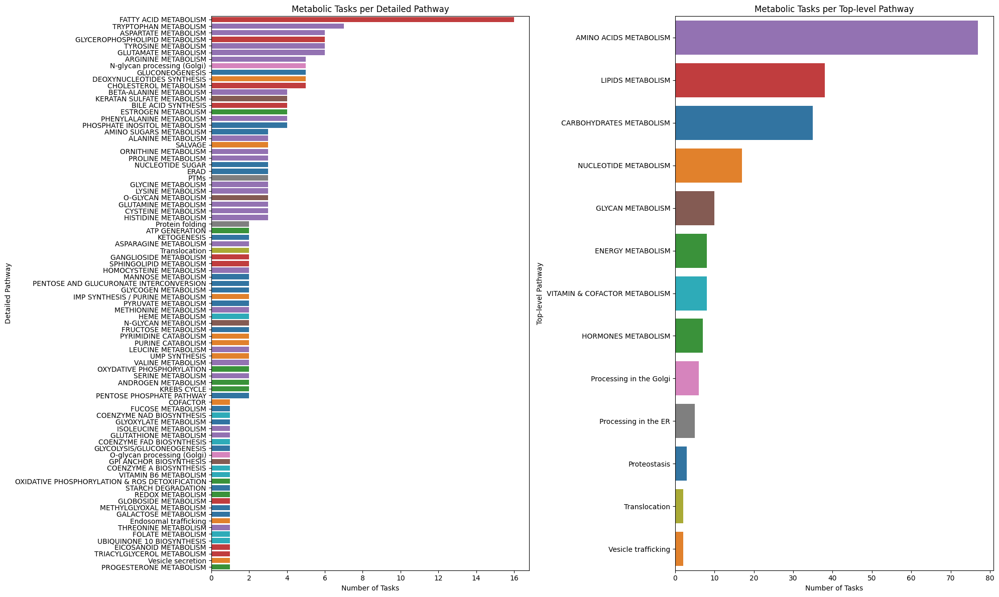

In [6]:
systems = tasks['System'].unique()
base_colors = sns.color_palette("tab10", len(systems))
system_color_map = {sys: base_colors[i] for i, sys in enumerate(systems)}

subsystems = tasks[['Subsystem', 'System']].drop_duplicates()
sub_color_map = {row['Subsystem']: system_color_map[row['System']]
                 for _, row in subsystems.iterrows()}

sub_counts = tasks['Subsystem'].value_counts()
sys_counts = tasks['System'].value_counts()

fig, axes = plt.subplots(1, 2, figsize=(20, 12), sharex=False)

sns.barplot(
    y=sub_counts.index,
    x=sub_counts.values,
    palette=[sub_color_map[sub] for sub in sub_counts.index],
    ax=axes[0]
)
axes[0].set_title("Metabolic Tasks per Detailed Pathway")
axes[0].set_xlabel("Number of Tasks")
axes[0].set_ylabel("Detailed Pathway")

sns.barplot(
    y=sys_counts.index,
    x=sys_counts.values,
    palette=[system_color_map[sys] for sys in sys_counts.index],
    ax=axes[1]
)
axes[1].set_title("Metabolic Tasks per Top-level Pathway")
axes[1].set_xlabel("Number of Tasks")
axes[1].set_ylabel("Top-level Pathway")

plt.tight_layout()
plt.show()

In [7]:
task_filter = tasks[tasks['Task'].isin(active_tasks)]

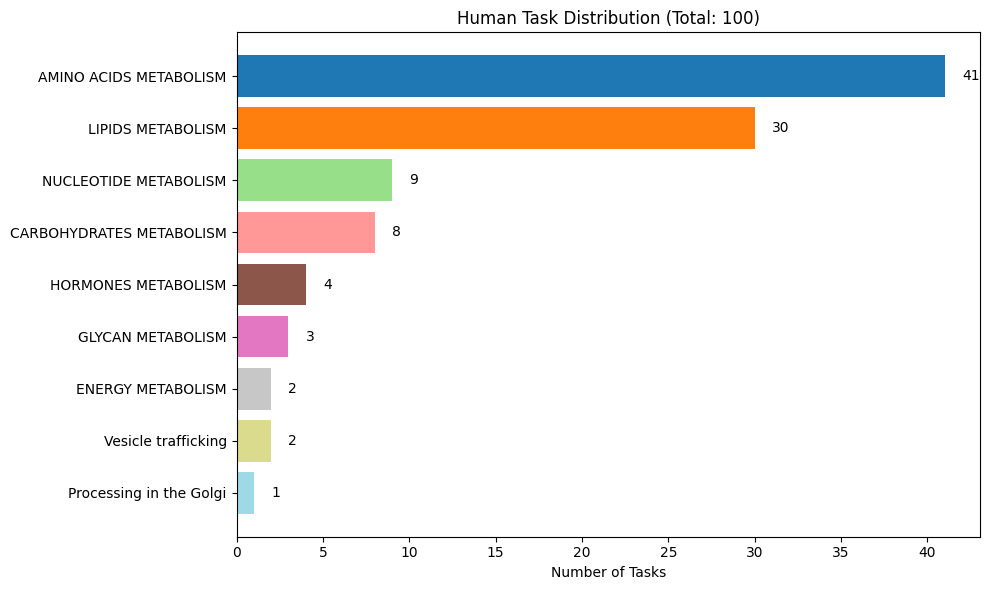

In [8]:
counts = task_filter['System'].value_counts()

plt.figure(figsize=(10, 6))

colors = plt.cm.tab20(np.linspace(0, 1, len(counts)))
bars = plt.barh(counts.index, counts.values, color=colors)

for bar in bars:
    width = bar.get_width()
    plt.text(
        width + 1,                      
        bar.get_y() + bar.get_height()/2,
        str(int(width)),
        va='center',
        fontsize=10
    )

plt.xlabel("Number of Tasks")
plt.title(f"Human Task Distribution (Total: {counts.sum()})")

plt.gca().invert_yaxis()  

plt.tight_layout()
plt.show()

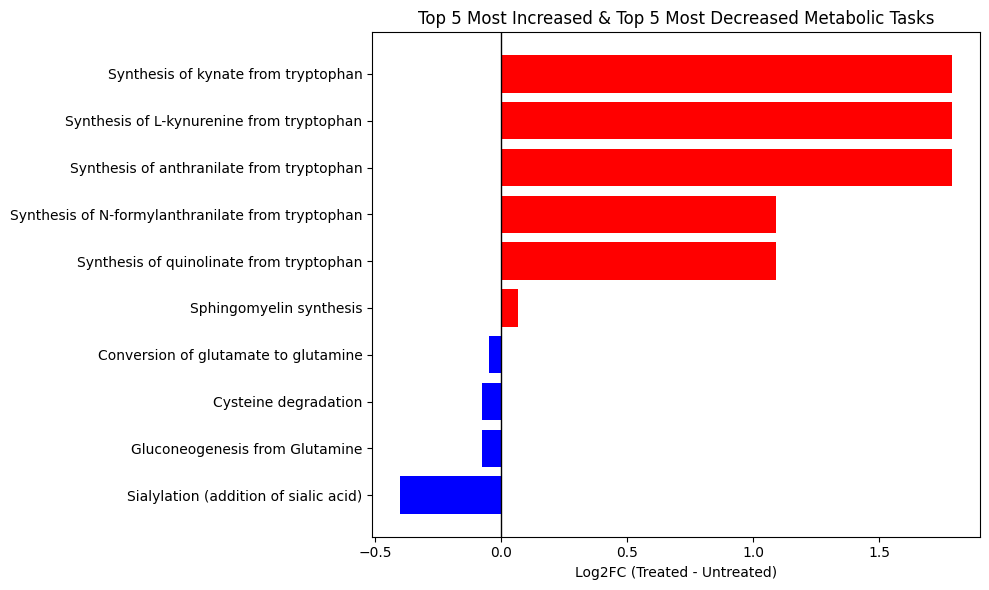

In [9]:
treated = df[df["Treatment_Status"] == "Treated"]
untreated = df[df["Treatment_Status"] == "Untreated"]

meta_cols = ["Subject_ID", "Treatment_Status", "Cell_ID", "Cell_type", "x", "y"]
task_cols = [c for c in df.columns if c not in meta_cols]

results = []

for task in task_cols:
    t_vals = treated[task].dropna()
    u_vals = untreated[task].dropna()
    
    stat, p = mannwhitneyu(t_vals, u_vals, alternative="two-sided")
    
    log2fc = np.log2(t_vals.median() / u_vals.median())
    
    results.append({
        "Task": task,
        "log2FC": log2fc,
        "p_value": p
    })

res = pd.DataFrame(results)

top_inc = res.sort_values("log2FC", ascending=False).head(5)
top_dec = res.sort_values("log2FC", ascending=True).head(5)

plot_df = pd.concat([top_dec, top_inc]).reset_index(drop=True)

plot_df = plot_df.sort_values("log2FC")

plt.figure(figsize=(10, 6))
colors = ["blue" if x < 0 else "red" for x in plot_df["log2FC"]]

plt.barh(plot_df["Task"], plot_df["log2FC"], color=colors)
plt.axvline(0, color="black", linewidth=1)
plt.xlabel("Log2FC (Treated - Untreated)")
plt.title("Top 5 Most Increased & Top 5 Most Decreased Metabolic Tasks")
plt.tight_layout()
plt.show()


### Split Violin Plot

Top tasks: ['(R)-3-Hydroxybutanoate synthesis', 'ATP generation from glucose (hypoxic conditions) - glycolysis', 'ATP regeneration from glucose (normoxic conditions) - glycolysis + krebs cycle', 'Acetoacetate synthesis', 'Alanine degradation']


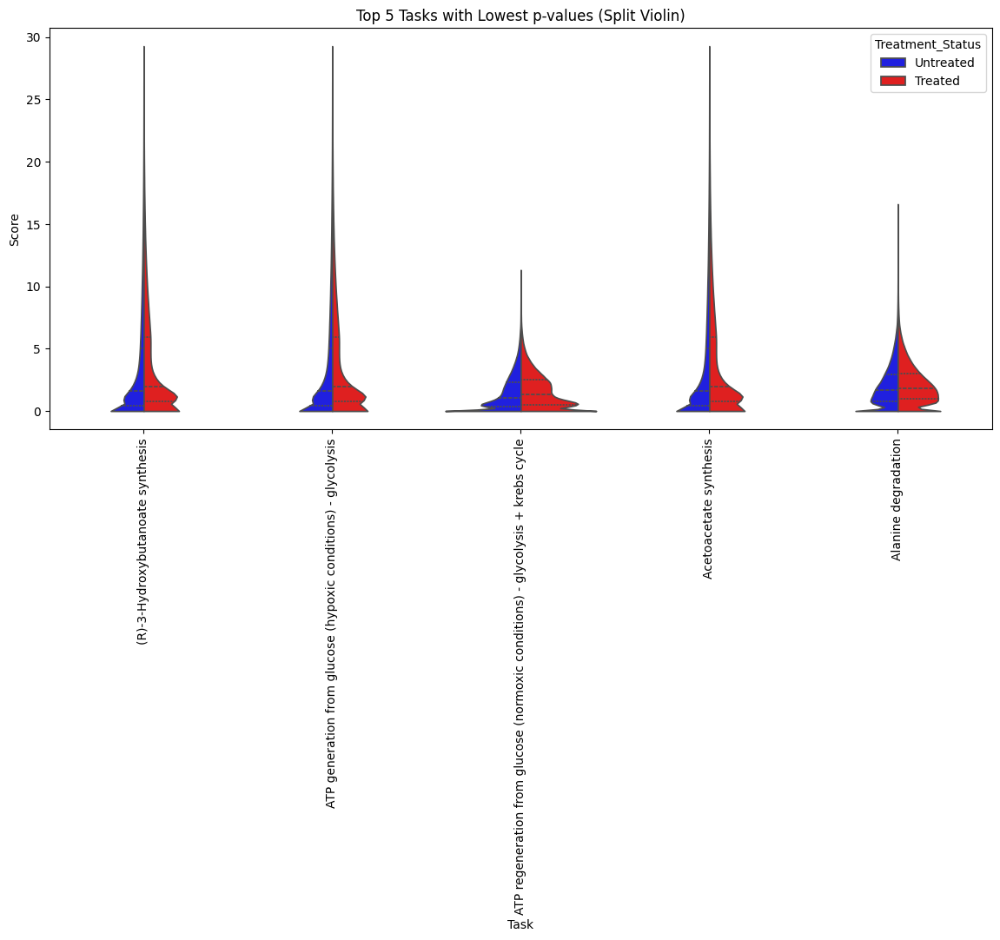

In [10]:
##### Apply t-test to find top 5 tasks with lowest p-values
task_cols = [
    c for c in df.columns 
    if c not in ["Treatment_Status", "Subject_ID", "Cell_ID", "Cell_type"]
]


# Compute t-test p-values
stats = []

for task in task_cols:
    t_vals = df[df["Treatment_Status"] == "Treated"][task].dropna()
    u_vals = df[df["Treatment_Status"] == "Untreated"][task].dropna()

    if len(t_vals) < 3 or len(u_vals) < 3:
        continue

    stat, p = ttest_ind(t_vals, u_vals, equal_var=False, nan_policy="omit")
    stats.append((task, p))

pvals = pd.DataFrame(stats, columns=["Task", "p_value"])
pvals = pvals.sort_values("p_value", ascending=True)

# select top 5 tasks
top_tasks = pvals["Task"].head(5).tolist()
print("Top tasks:", top_tasks)

# Prepare melted dataframe only for top 5
df_melt = df.melt(
    id_vars="Treatment_Status",
    value_vars=top_tasks,
    var_name="Task",
    value_name="Score"
)

# 4Split violin plot (red=treated, blue=untreated)
plt.figure(figsize=(14, 6))
sns.violinplot(
    data=df_melt,
    x="Task",
    y="Score",
    hue="Treatment_Status",
    split=True,
    palette={"Treated": "red", "Untreated": "blue"},
    inner="quartile",
    cut=0
)

plt.xticks(rotation=90)
plt.title("Top 5 Tasks with Lowest p-values (Split Violin)")
plt.tight_layout()
plt.show()


Top tasks: ['(R)-3-Hydroxybutanoate synthesis', 'ATP generation from glucose (hypoxic conditions) - glycolysis', 'ATP regeneration from glucose (normoxic conditions) - glycolysis + krebs cycle', 'Acetoacetate synthesis', 'Alanine degradation']


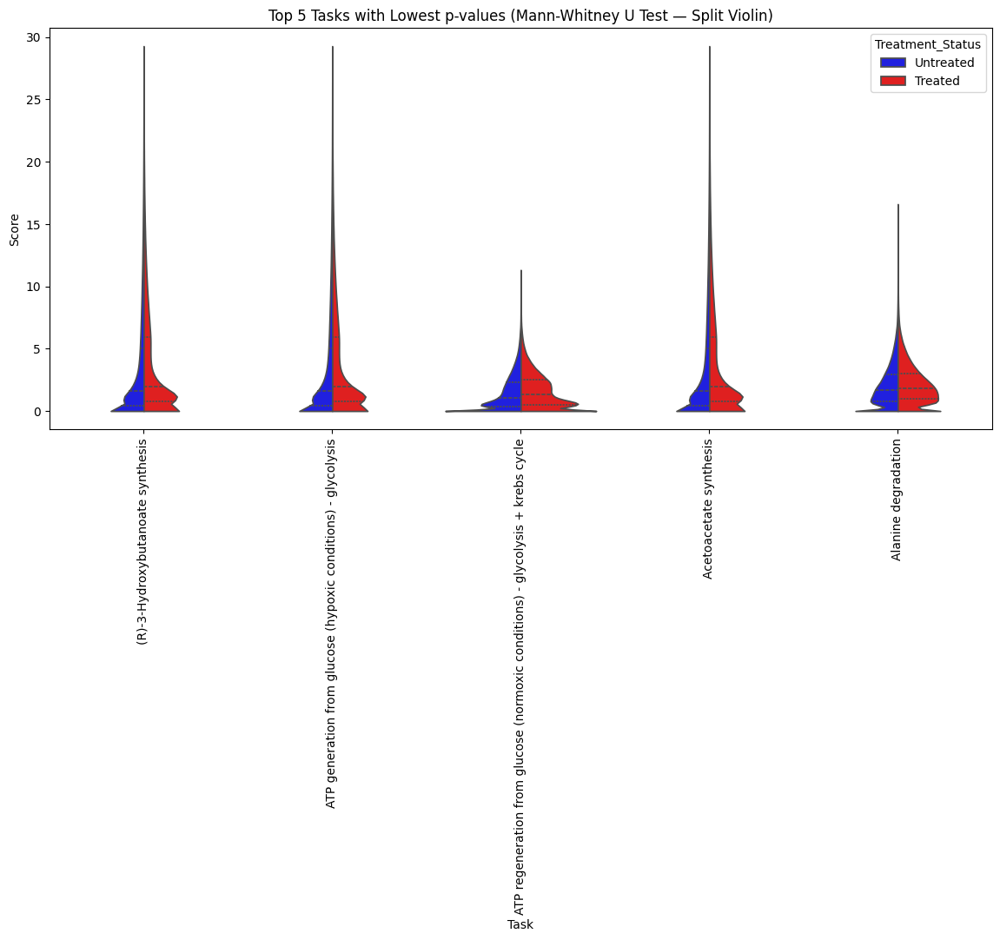

In [11]:
##### Apply manwhitney to find top 5 tasks with lowest p-values

task_cols = [
    c for c in df.columns 
    if c not in ["Treatment_Status", "Subject_ID", "Cell_ID", "Cell_type"]
]

stats = []

for task in task_cols:
    t_vals = df[df["Treatment_Status"] == "Treated"][task].dropna()
    u_vals = df[df["Treatment_Status"] == "Untreated"][task].dropna()

    if len(t_vals) < 3 or len(u_vals) < 3:
        continue

    # 🟦 Mann–Whitney U test
    stat, p = mannwhitneyu(t_vals, u_vals, alternative="two-sided")
    stats.append((task, p))

pvals = pd.DataFrame(stats, columns=["Task", "p_value"])
pvals = pvals.sort_values("p_value", ascending=True)

top_tasks = pvals["Task"].head(5).tolist()
print("Top tasks:", top_tasks)

df_melt = df.melt(
    id_vars="Treatment_Status",
    value_vars=top_tasks,
    var_name="Task",
    value_name="Score"
)

plt.figure(figsize=(14, 6))
sns.violinplot(
    data=df_melt,
    x="Task",
    y="Score",
    hue="Treatment_Status",
    split=True,
    palette={"Treated": "red", "Untreated": "blue"},
    inner="quartile",
    cut=0
)

plt.xticks(rotation=90)
plt.title("Top 5 Tasks with Lowest p-values (Mann-Whitney U Test — Split Violin)")
plt.tight_layout()
plt.show()


### Cell Type Analysis

In [ ]:
# mean_task_ct = (
#     df.groupby(["Cell_type", "Treatment_Status"])[task_cols]
#       .mean()
#       .reset_index()
# )
# mean_task_ct.head()

In [ ]:
# df_group = mean_task_ct.groupby(["Cell_type", "Treatment_Status"]).mean()
# df_group

In [ ]:
# valid_tasks = [t for t in tasks['Task'] if t in df.columns]
# valid_tasks

In [ ]:
# results = []
# for task in valid_tasks:
#     for ct in df["Cell_type"].unique():
#         g1 = df[(df.Cell_type==ct)&(df.Treatment_Status=="Treated")][task]
#         g2 = df[(df.Cell_type==ct)&(df.Treatment_Status=="Untreated")][task]
#         stat,p = mannwhitneyu(g1,g2,alternative="two-sided")
#         results.append([ct,task,p])


In [ ]:
# results_df = pd.DataFrame(results, columns=["Cell_type","Task","p_value"])
# results_df

In [12]:
# results_df.to_csv("Task_celltype_pvalues.csv", index=False)
results_df = pd.read_csv("Task_celltype_pvalues.csv")

In [13]:
df_sig = results_df[results_df.p_value < 0.05]
df_sig

,Cell_type,Task,p_value
0,Malignant,(R)-3-Hydroxybutanoate synthesis,0.000000e+00
1,ILC,(R)-3-Hydroxybutanoate synthesis,8.279974e-52
2,Plasma_IgG,(R)-3-Hydroxybutanoate synthesis,0.000000e+00
3,Fib_LGALS1,(R)-3-Hydroxybutanoate synthesis,6.809263e-05
4,Fib_RGS5,(R)-3-Hydroxybutanoate synthesis,7.141826e-32
...,...,...,...
5494,EC_Artery,Synthesis of testosterone from androstenedione,4.406192e-13
5495,CD8_Naive,Synthesis of testosterone from androstenedione,1.577861e-13
5496,EC_Lymphatic,Synthesis of testosterone from androstenedione,5.312426e-03
5497,B_Naive,Synthesis of testosterone from androstenedione,6.440780e-07


In [14]:
df_sig.groupby("Cell_type")["Task"].count().sort_values(ascending=False)

Cell_type
Fib_ACTA2          100
Plasma_IgG         100
Treg               100
SMC_ECM            100
Fib_PTGDS          100
Fib_ECM            100
Fib_CXCL14         100
Nph_Inflam_IL1B    100
Plasma_IgM         100
Pericyte           100
SMC_Contractile     99
Fib_LGALS1          98
Malignant           98
NK                  97
Mph_M1_like         97
Nph_Immature        97
Epithelial          96
Fib_CXCL12          96
Mph_M2_like         95
DC_moDC             94
B_Naive             94
EC_HEV              94
EC_Inflam           93
Mono_CD14           92
Nph_APC             92
Nph_Inflam_CCL3     85
CD4_CM              85
B_GC                84
CD4_EM              84
CD4_Naive           83
Mast                83
CD8_CM              81
EC_Capillary        81
ILC                 80
CD8_EM              79
CD8_Naive           78
Fib_RGS5            78
Mph_APC             78
Mph_ISG             78
gdT                 77
EC_Artery           77
Fib_CXCL8           76
Mph_SPP1            73
D

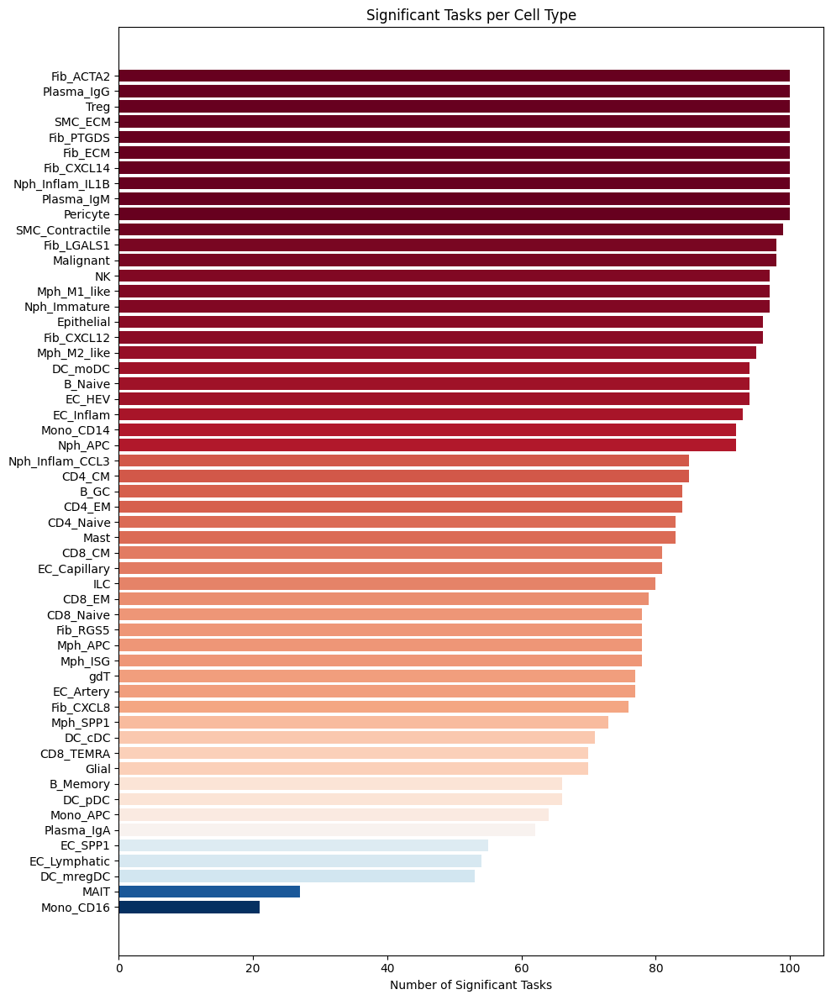

In [15]:
counts = df_sig.groupby("Cell_type")["Task"].count().sort_values(ascending=False)

norm = (counts - counts.min()) / (counts.max() - counts.min())
colors = plt.cm.RdBu_r(norm)

plt.figure(figsize=(10, 12))
plt.barh(counts.index, counts.values, color=colors)
plt.gca().invert_yaxis()  
plt.xlabel("Number of Significant Tasks")
plt.title("Significant Tasks per Cell Type")
plt.tight_layout()
plt.show()

### Spatial Analysis

In [16]:
from pathlib import Path

RESULTS_DIR = Path().resolve() / "sccellfie_results_new"

patient_sizes = []

for folder in RESULTS_DIR.iterdir():
    if not folder.is_dir():
        continue
    base_path = folder / f"{folder.name}.h5ad"
    if not base_path.exists():
        continue
    
    adata = sc.read_h5ad(base_path)
    patient_sizes.append((folder.name, adata.n_obs))

best_patient = sorted(patient_sizes, key=lambda x: x[1], reverse=True)[0][0]
best_patient

'1209622B'

In [17]:
patient_dir = RESULTS_DIR / best_patient

adata = sc.read_h5ad(patient_dir / f"{best_patient}.h5ad")
adata_tasks = sc.read_h5ad(patient_dir / f"{best_patient}_metabolic_tasks.h5ad")
adata_react = sc.read_h5ad(patient_dir / f"{best_patient}_reactions.h5ad")

In [18]:
adata_tasks

AnnData object with n_obs × n_vars = 170619 × 100
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'cell_ID', 'fov', 'Area', 'TMA', 'Subject_ID', 'Treatment_Status', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'n_counts', 'n_genes', 'Lineage_level2', 'Lineage_level1', 'Lineage_level3', 'Lineage_level4'
    uns: 'Lineage_level3_colors', 'Lineage_level4_colors', 'log1p', 'neighbors_30', 'normalization', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap', 'spatial'
    obsp: 'neighbors_30_connectivities', 'neighbors_30_distances'

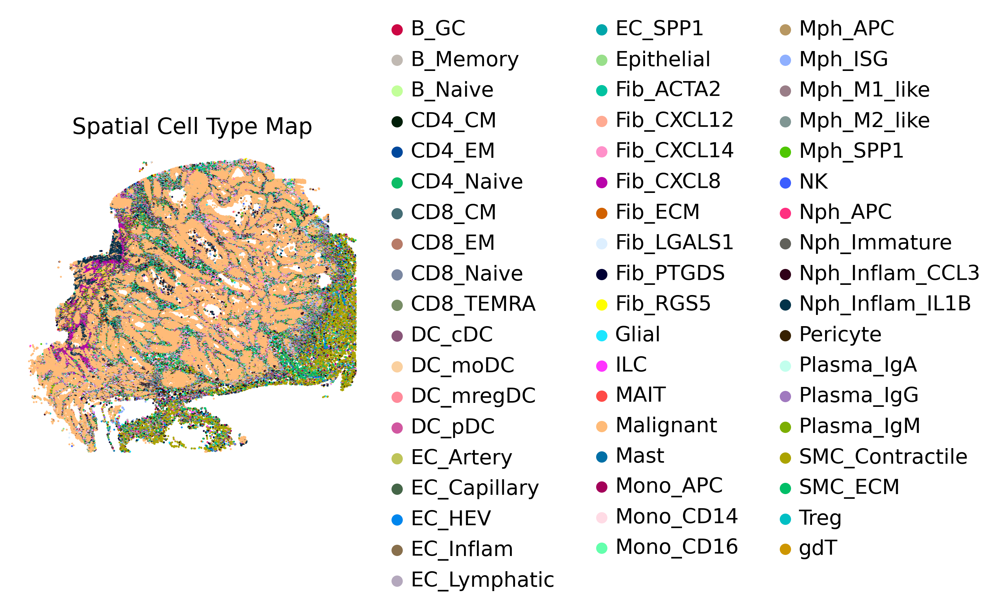

In [20]:
sc.settings.set_figure_params(dpi=160, facecolor="white")

sc.pl.spatial(
    adata,
    color="Lineage_level4",
    spot_size=300,
    frameon=False,
    alpha=0.95,
    cmap=None,
    legend_loc="right margin",
    title="Spatial Cell Type Map"
)

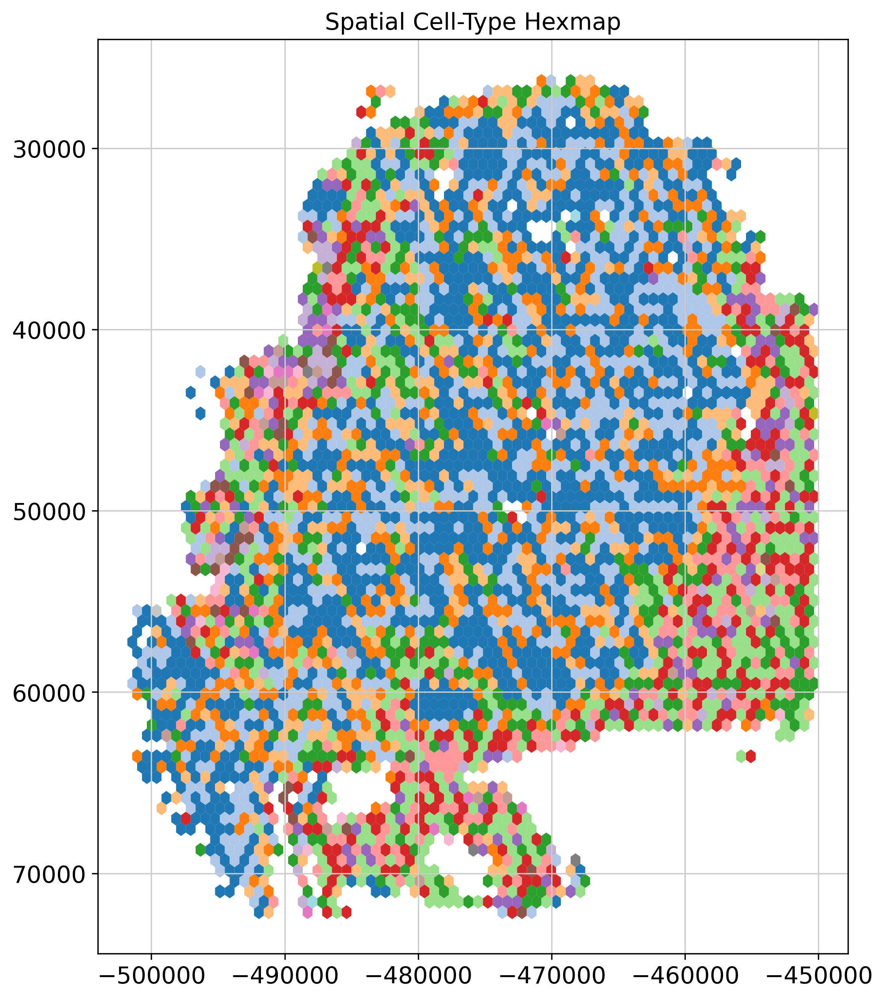

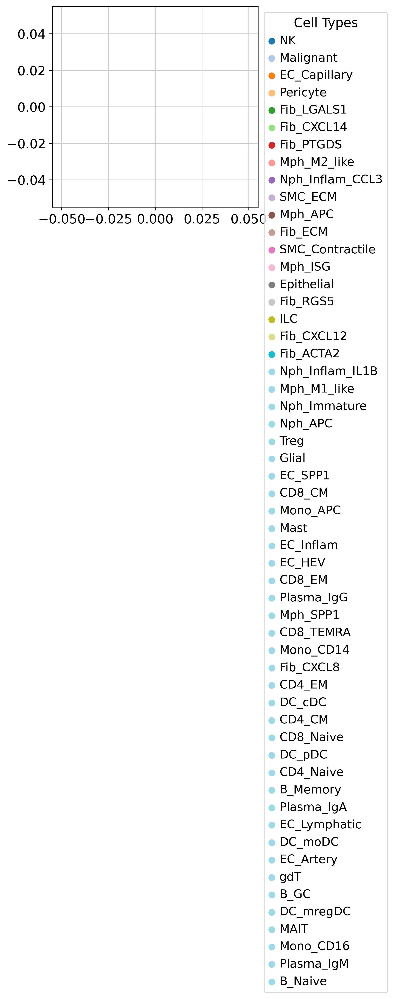

In [21]:
x = adata.obsm["spatial"][:,0]
y = adata.obsm["spatial"][:,1]
ct = adata.obs["Lineage_level4"].astype("category")

# Factorizing cell types into integers for coloring
ct_codes, uniques = pd.factorize(ct)

plt.figure(figsize=(8,10))

hb = plt.hexbin(
    x, y,
    C=ct_codes,
    reduce_C_function=np.mean,
    gridsize=70,
    cmap="tab20",
    linewidths=0
)

plt.gca().invert_yaxis()
plt.title("Spatial Cell-Type Hexmap")
plt.xlabel(""); plt.ylabel("")
plt.show()

# legend
for i, u in enumerate(uniques):
    plt.scatter([], [], color=plt.get_cmap("tab20")(i), label=u, s=40)
plt.legend(bbox_to_anchor=(1,1), loc="upper left", title="Cell Types")
plt.show()


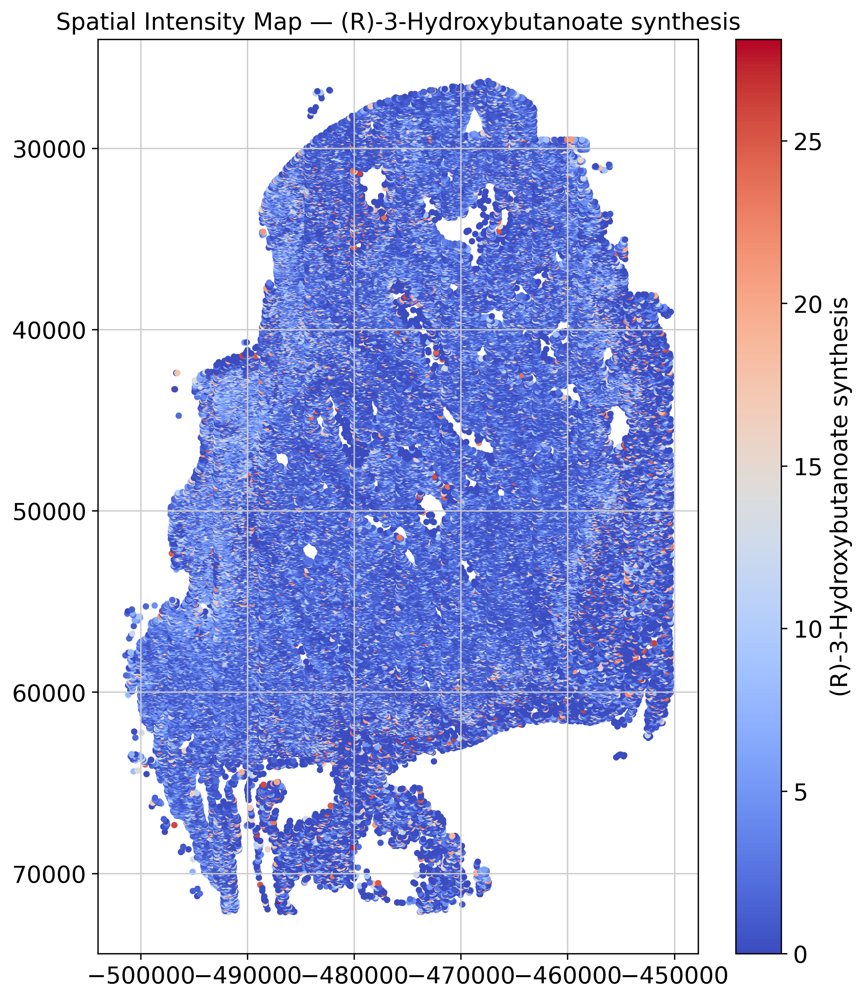

In [22]:
feature = "(R)-3-Hydroxybutanoate synthesis"


plt.figure(figsize=(8,10))
plt.scatter(
    x,
    y,
    c=adata_tasks[:, feature].X.toarray().flatten()
       if hasattr(adata_tasks[:, feature].X, "toarray")
       else adata_tasks[:, feature].X,
    cmap="coolwarm",
    s=8
)
plt.gca().invert_yaxis()
plt.colorbar(label=feature)
plt.title(f"Spatial Intensity Map — {feature}")
plt.show()


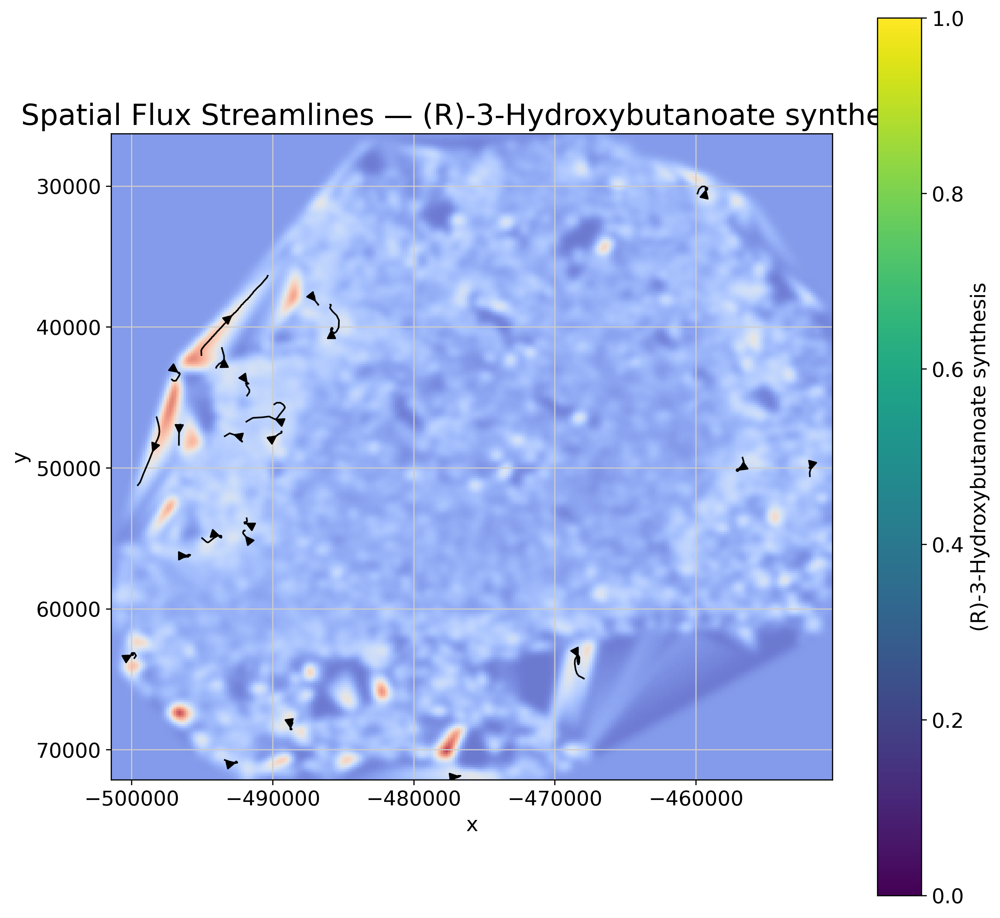

In [ ]:
# ---- 1. Extract coords ----
coords = adata_tasks.obsm["spatial"]
x = coords[:, 0]
y = coords[:, 1]

# ---- 2. Extract expression vector ----
vals = adata_tasks[:, feature].X
vals = vals.toarray().flatten() if hasattr(vals, "toarray") else vals

# normalize to 0..1
vals_norm = (vals - vals.min()) / (vals.max() - vals.min() + 1e-6)

# ---- 3. Make a grid for interpolation ----
gx = np.linspace(x.min(), x.max(), 300)
gy = np.linspace(y.min(), y.max(), 300)
GX, GY = np.meshgrid(gx, gy)

# ---- 4. Interpolate using griddata (MUCH lighter than RBF) ----
points = np.vstack([x, y]).T
GZ = griddata(points, vals_norm, (GX, GY), method="linear")

# Fill NaNs (empty grid pixels)
GZ = np.nan_to_num(GZ, nan=np.nanmedian(vals_norm))

# ---- 5. Smoothing ----
GZ = gaussian_filter(GZ, sigma=2)

# ---- 6. Gradient (flux proxy) ----
Fx, Fy = np.gradient(GZ)

# ---- 7. Hotspot mask (top 10%) ----
thr = np.percentile(GZ, 90)
mask = GZ > thr
Fx_masked = Fx * mask
Fy_masked = Fy * mask

# ---- 8. Plot ----
plt.figure(figsize=(11, 11))

plt.imshow(
    GZ,
    extent=[x.min(), x.max(), y.min(), y.max()],
    origin='lower',
    cmap="coolwarm",
    alpha=0.75
)

plt.streamplot(
    gx, gy,
    Fx_masked, Fy_masked,
    density=1.1,
    color="black",
    arrowsize=1.3,
    linewidth=1.1
)

plt.gca().invert_yaxis()

plt.title(f"Spatial Flux Streamlines — {feature}", fontsize=20)
plt.xlabel("x")
plt.ylabel("y")
plt.colorbar(label=feature)

plt.show()
